In [25]:
%pip install -q --proxy http://proxy:80 statsmodels

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
######## Search space #########
import sys
sys.path.append("../")
from search_space.RegNet import RegNet
from search_space.utils import create_widths_plot, scatter_results
# Initialize an empty list to store dictionaries
def results_to_df(path, name):
    data = []
    # Open the text file
    with open(path, 'r') as file:
        lines = file.readlines()
        # Initialize an empty dictionary to store data for each block
        block_data = {}
        for line in lines:
            # If the line contains dashes, it indicates the end of a block
            if '-------------------------' in line:
                # If block_data is not empty, add it to the list of data dictionaries
                if block_data:
                    data.append(block_data)
                    # Reset block_data for the next block
                    block_data = {}
            elif 'best_acc' in line:
                continue
            else:
                # Split the line by ':'
                #print(line)
                key, value = line.strip().split(': ')
                # Store the key-value pair in the block_data dictionary
                block_data[key] = value

    # Create a DataFrame from the list of dictionaries
    df = pd.DataFrame(data)

    # Convert columns to appropriate data types if needed
    df['epoch'] = df['epoch'].astype(int)
    df['lr'] = df['lr'].astype(float)
    df['train_acc'] = df['train_acc'].astype(float)
    df['train_loss'] = df['train_loss'].astype(float)
    df['test_acc'] = df['test_acc'].astype(float)
    df['test_acc_top5'] = df['test_acc_top5'].astype(float)
    df['test_loss'] = df['test_loss'].astype(float)
    df['epoch_time'] = df['epoch_time'].astype(float)
    df=df.assign(name=name)
    
    return df
def percentage_of_elements_in_list(list1, list2):
    # Count the number of elements in list1 that are also in list2
    common_elements_count = sum(1 for element in list1 if element in list2)
    # Calculate the percentage
    percentage = (common_elements_count / len(list1)) * 100
    return percentage


import os
def get_vainilla_dfs(folder, epochs, corr=False):
    students=os.listdir(folder)
    print(students)
    sudents=[student for student in students if "ipynb_checkpoints" not in student]
    students_df=[]
    for student in students:
        try:
            students_df.append(results_to_df(f"{folder}/{student}/worklog.txt", student))
        except:
            pass
    students_df=pd.concat(students_df, ignore_index=True)
    students_df=students_df.sort_values(by=["epoch","test_acc"], ascending=[False,False])
    students_df=students_df.assign(study="vainilla")
    
    idx = students_df.groupby("name")["test_acc"].idxmax()
    #idx = students_df.groupby("name")["epoch"].idxmax()
    max_test_acc_rows = students_df.loc[idx]
    sorted_df=max_test_acc_rows.sort_values(by="test_acc")
    sorted_df=sorted_df.rename(columns={"test_acc":"best_acc"})
    order_students=list(sorted_df.name.values)

    vainilla_students=[]
    students_df["name"] = pd.Categorical(students_df["name"], categories=order_students, ordered=True)
    for i in range(1,epochs+1):
        vainilla_students.append(students_df[students_df.epoch==i].sort_values(by="name")) 
    
    corr_coeff_vainilla=[]
    if corr:
        for epoch in vainilla_students:
            correlation_coefficient =np.corrcoef(list(epoch['test_acc'].values),list(sorted_df['best_acc'].values))
            corr_coeff_vainilla.append(correlation_coefficient[0,1])
    return order_students, sorted_df, vainilla_students, corr_coeff_vainilla


def get_students_dfs(folder, epochs,sorted_df,order_students,study, corr=False, corr_n=20):
    students_list=os.listdir(folder)
    students_kd=[student for student in students_list if os.path.isdir(f"{folder}/{student}")]
    students_kd_df=[]

    for student in students_kd:
        students_kd_df.append(results_to_df(f"{folder}/{student}/worklog.txt", student))
    students_kd_df=pd.concat(students_kd_df, ignore_index=True)
    students_kd_df=students_kd_df.sort_values(by=["epoch","test_acc"], ascending=[False,False])
    students_kd_df=students_kd_df.assign(study=study)
    
    #students_kd_df['name']=students_kd_df['name'].str.split('_').str[1:3].str.join('_')

    kd_students=[]
    students_kd_df["name"] = pd.Categorical(students_kd_df["name"], categories=order_students, ordered=True)
    for i in range(1,epochs+1):
        kd_students.append(students_kd_df[students_kd_df.epoch==i].sort_values(by="name")) 

    corr_coeff_kd=[]
    if corr==True:
        for epoch in kd_students:
            correlation_coefficient =np.corrcoef(list(epoch['test_acc'].values[:corr_n]),list(sorted_df['best_acc'].values[:corr_n]))
            corr_coeff_kd.append(correlation_coefficient[0,1])    
    return kd_students, corr_coeff_kd

/home/hpc/iwb3/iwb3021h/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [29]:
metadata={"num_classes": 4, "input_shape": [49260, 3, 64, 64], "codename": "Caitie", "benchmark":47.008}
regnet_space=RegNet(metadata,
                    W0=[8, 56, 8],
                    WA=[8, 48, 8],
                    WM=[2.0,2.9,0.05],
                    D=[6,20,1], 
                    G=[8,8,8], 
                    base_config="../configs/search_space/config.yaml")

In [155]:
#WA,W0,WM,DEPTH=48,24,2.4,12
test_folder="tests_one_model"
generation=1
#config_updates=["REGNET.STEM_W",32, "MODEL.NUM_CLASSES",20]
config_updates=None
models, chromosomes=regnet_space.load_generation(folder=f"{test_folder}/Generation_{generation}_SE", config_updates=config_updates)


res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'stem_type': 'res_stem_cifar', 'stem_w': 32, 'block_type': 'res_bottleneck_block', 'depths': [1, 1, 3, 4, 9, 2], 'widths': [8, 72, 144, 288, 592, 1216], 'strides': [2, 2, 2, 2, 2, 2], 'bot_muls': [1.0, 1.0, 1.0, 1.0, 1.0, 1.0], 'group_ws': [8, 8, 8, 8, 8, 8], 'head_w': 0, 'se_r': 0.25, 'num_classes': 20, 'downsample': 'avg', 'drop_path_rate': 0.0}
Loading model: tests_one_model/Generation_1_SE/olive_wasp/config.yaml
res_bottleneck_block
res

In [9]:
chromosomes[list(chromosomes.keys())[0]]

{'ws': [24, 48, 96, 192, 384, 768],
 'bs': [1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 'gs': [8, 8, 8, 8, 8, 8],
 'ds': [1, 1, 1, 4, 6, 5],
 'num_stages': 6,
 'total_size_mb': 39.516258239746094,
 'h': 1,
 'w': 1,
 'flops': 1812518,
 'params': 10358950,
 'acts': 8678,
 'WA': 40.0,
 'W0': 24,
 'WM': 2.0,
 'DEPTH': 18,
 'GROUP_W': 8}

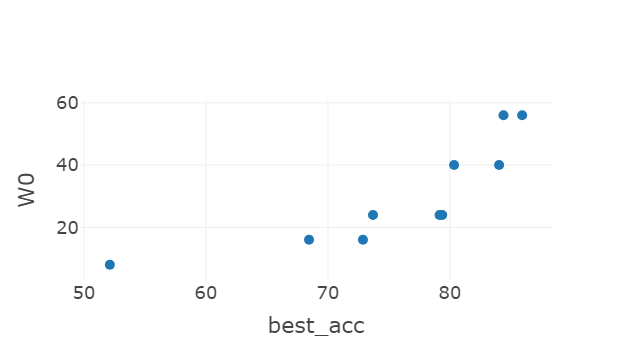

In [21]:
scatter_results(chromosomes,  "W0","best_acc","tests_one_model/Generation_1_NOSE_D/results.csv")

# AddNIST results

In [17]:
#sorted_df["NOSE_D"].to_csv("tests_one_model/Generation_1_NOSE_D/results.csv")

In [23]:
folders=["tests_one_model/Generation_1_SE","tests_one_model/Generation_1_SE_D","tests_one_model/Generation_1_NOSE_D","tests_one_model/Generation_1_NOSE_NOD","tests_one_model/Generation_1_NOSE_D_DropPath"]
sorted_df={}
corr_coeff_vainilla={}
vainilla_students={}
order_students={}
for folder in folders:
    name=f"{folder.split("/")[1][13:]}"
    order_students[name], sorted_df[name], vainilla_students[name], corr_coeff=get_vainilla_dfs(folder, 20, True)
    sorted_df[name]["study"]=name
    sorted_df[name]= sorted_df[name].reset_index().reset_index()
    corr_coeff_vainilla[name]=pd.DataFrame(corr_coeff).reset_index()
    corr_coeff_vainilla[name]["study"]=name

['olive_wasp', 'hospitable_pronghorn', 'spectral_hare', 'loyal_tiger', 'astute_badger', 'quizzical_caiman', 'zircon_toad', 'hypersonic_sambar', 'honest_saluki', 'neat_puffin']
['olive_wasp', 'hospitable_pronghorn', 'spectral_hare', 'loyal_tiger', 'astute_badger', 'quizzical_caiman', 'zircon_toad', 'hypersonic_sambar', 'honest_saluki', 'neat_puffin']
['olive_wasp', 'hospitable_pronghorn', 'spectral_hare', 'loyal_tiger', 'astute_badger', 'quizzical_caiman', 'zircon_toad', 'hypersonic_sambar', 'honest_saluki', 'results.csv', 'neat_puffin']
['olive_wasp', 'hospitable_pronghorn', 'spectral_hare', 'loyal_tiger', 'astute_badger', 'quizzical_caiman', 'zircon_toad', 'hypersonic_sambar', 'honest_saluki', 'neat_puffin']
['olive_wasp', 'hospitable_pronghorn', 'spectral_hare', '.ipynb_checkpoints', 'loyal_tiger', 'astute_badger', 'quizzical_caiman', 'zircon_toad', 'hypersonic_sambar', 'honest_saluki', 'neat_puffin']


In [4]:
sorted_df.keys()

dict_keys(['SE', 'SE_D', 'NOSE_D', 'NOSE_NOD', 'NOSE_D_DropPath'])

In [38]:
kd_students, corr_coeff_kd=get_students_dfs("tests_one_model/Generation_1_SE_D_warmup_labels01_s1", 2, sorted_df["SE_D"],order_students["SE_D"], "SE_D_label", corr=True, corr_n=20)

In [39]:
corr_coeff_kd

[0.9141923219017162, 0.7565509799604345]

In [31]:
corr_coeff_kd

[0.9141923219017162, 0.7565509799604345]

In [3]:
ep=0
scatter_df=pd.concat([sorted_df["SE"],sorted_df["SE_D"],sorted_df["NOSE_D"],sorted_df["NOSE_NOD"],sorted_df["NOSE_D_DropPath"]])
#scatter_df=pd.merge(scatter_df, sorted_df[["name","best_acc"]], on="name")

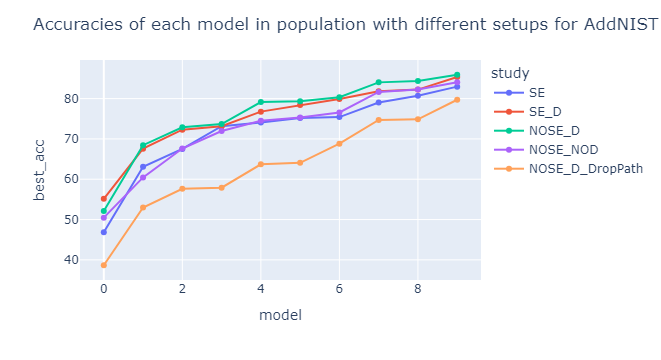

In [11]:
import plotly.express as px

fig = px.line(scatter_df,x="level_0", y="best_acc",color='study', markers=True)
#fig.add_scatter(x=x, y=y_std, mode='markers', name='Data2',trendline="ols", marker=dict(color='green'))
fig.update_layout(height=700)
fig.update_layout(xaxis_title='model', title="Accuracies of each model in population with different setups for AddNIST dataset")
fig.show()

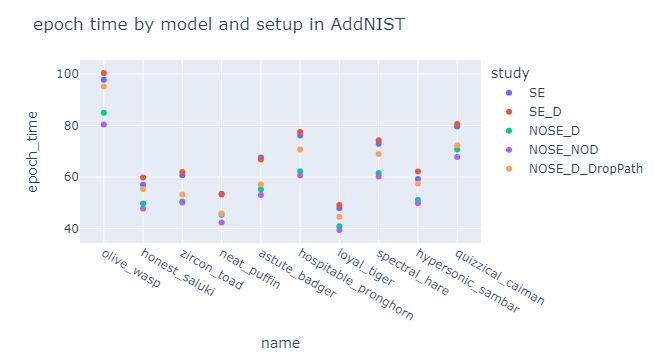

In [14]:
import plotly.express as px

fig = px.scatter(scatter_df,x="name", y="epoch_time",color='study')
#fig.add_scatter(x=x, y=y_std, mode='markers', name='Data2',trendline="ols", marker=dict(color='green'))
fig.update_layout(height=500, title="epoch time by model and setup in AddNIST")
fig.show()

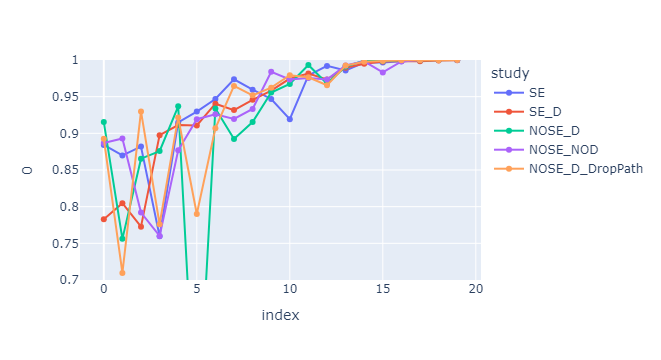

In [31]:
import plotly.express as px
scatter_df=pd.concat([corr_coeff_vainilla["SE"],corr_coeff_vainilla["SE_D"],corr_coeff_vainilla["NOSE_D"],corr_coeff_vainilla["NOSE_NOD"], corr_coeff_vainilla["NOSE_D_DropPath"]])
fig = px.line(scatter_df,x="index", y=0,color='study', markers=True)
#fig.add_scatter(x=x, y=y_std, mode='markers', name='Data2',trendline="ols", marker=dict(color='green'))
fig.update_layout(height=800)
fig.update_yaxes(range=[0.7, 1]) 
fig.show()

In [47]:
sorted_df["NOSE_D"]

,level_0,index,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,name,study
0,0,19,20,0.000062,50.28,1.50,52.12,87.22,1.48,84.96,olive_wasp,NOSE_D
1,1,179,20,0.000062,66.92,1.04,68.45,94.04,1.01,49.73,honest_saluki,NOSE_D
2,2,139,20,0.000062,72.22,0.88,72.87,95.31,0.86,50.45,zircon_toad,NOSE_D
3,3,199,20,0.000062,72.65,0.87,73.69,95.42,0.84,45.29,neat_puffin,NOSE_D
4,4,99,20,0.000062,79.15,0.66,79.15,96.95,0.68,55.19,astute_badger,NOSE_D
5,5,79,20,0.000062,78.70,0.68,79.37,96.85,0.68,40.92,loyal_tiger,NOSE_D
6,6,39,20,0.000062,81.00,0.61,80.34,97.11,0.64,62.21,hospitable_pronghorn,NOSE_D
7,7,159,20,0.000062,85.35,0.47,84.03,97.83,0.53,51.02,hypersonic_sambar,NOSE_D
8,8,59,20,0.000062,85.62,0.46,84.39,97.95,0.52,61.56,spectral_hare,NOSE_D
9,9,119,20,0.000062,87.78,0.39,85.92,98.35,0.47,70.71,quizzical_caiman,NOSE_D


# CIFARTile

In [176]:
#WA,W0,WM,DEPTH=48,24,2.4,12
test_folder="tests_cifar_tile"
generation=1
#config_updates=["REGNET.STEM_W",32, "MODEL.NUM_CLASSES",20]
config_updates=None
models, chromosomes=regnet_space.load_generation(folder=f"{test_folder}/Generation_{generation}", config_updates=config_updates)


res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'stem_type': 'res_stem_cifar', 'stem_w': 28, 'block_type': 'res_bottleneck_block', 'depths': [1, 4, 6, 8], 'widths': [32, 64, 144, 288], 'strides': [2, 2, 2, 2], 'bot_muls': [1.0, 1.0, 1.0, 1.0], 'group_ws': [16, 16, 16, 16], 'head_w': 0, 'se_r': 0.25, 'num_classes': 20, 'downsample': 'avg', 'drop_path_rate': 0.0}
Loading model: tests_filtered_regnet/Generation_1/steel_rook/config.yaml
res_bottleneck_block
res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 16, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0}
{'stem_

In [18]:
folders=["tests_cifar_tile/Generation_1_SE_D", "tests_cifar_tile/Generation_1_SE_NOD", "tests_cifar_tile/Generation_1_NOSE_D", "tests_cifar_tile/Generation_1_SE_D_s42_warmup","tests_cifar_tile/Generation_1_SE_D_lr001_s1","tests_cifar_tile/Generation_1_SE_D_s1_warmup_labels01"]
sorted_df={}
corr_coeff_vainilla={}
vainilla_students={}
order_students={}
for folder in folders:
    name=f"{folder.split("/")[1][13:]}"
    try:
        order_students[name], sorted_df[name], vainilla_students[name], corr_coeff=get_vainilla_dfs(folder, 20, True)
    except:
        order_students[name], sorted_df[name], vainilla_students[name], corr_coeff=get_vainilla_dfs(folder, 2, True)
    sorted_df[name]["study"]=name
    sorted_df[name]= sorted_df[name].reset_index().reset_index()
    corr_coeff_vainilla[name]=pd.DataFrame(corr_coeff).reset_index()
    corr_coeff_vainilla[name]["study"]=name

['wakeful_mongoose', 'didactic_zebu', 'lime_vulture', 'enormous_limpet', 'happy_raven', 'unselfish_ermine', 'dynamic_wasp', 'heavenly_squirrel', 'angelic_lizard', 'loutish_tiger', 'flying_capuchin', 'ultra_herring', 'whimsical_lemming', 'poetic_poodle', 'umber_binturong', 'magic_sidewinder', 'results.csv', 'agile_barracuda', 'invaluable_cormorant', 'optimal_elk', 'phenomenal_dragon']
['wakeful_mongoose', 'didactic_zebu', 'lime_vulture', 'enormous_limpet', 'happy_raven', 'unselfish_ermine', 'dynamic_wasp', 'heavenly_squirrel', 'angelic_lizard', 'loutish_tiger', 'flying_capuchin', 'ultra_herring', 'whimsical_lemming', 'poetic_poodle', 'umber_binturong', 'magic_sidewinder', 'agile_barracuda', 'invaluable_cormorant', 'optimal_elk', 'phenomenal_dragon']
['wakeful_mongoose', 'didactic_zebu', 'lime_vulture', 'enormous_limpet', 'happy_raven', 'unselfish_ermine', 'dynamic_wasp', 'heavenly_squirrel', 'angelic_lizard', 'loutish_tiger', 'flying_capuchin', 'ultra_herring', 'whimsical_lemming', 'poe

In [10]:
sorted_df["SE_D"]

,level_0,index,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,name,study
0,0,18,19,0.000245,34.12,1.33,34.36,60.33,1.36,99.20,wakeful_mongoose,SE_D
1,1,198,19,0.000245,46.03,1.13,46.64,74.61,1.13,57.74,loutish_tiger,SE_D
2,2,158,19,0.000245,47.68,1.11,47.38,75.10,1.23,97.15,heavenly_squirrel,SE_D
3,3,37,18,0.000545,48.02,1.10,47.71,75.91,1.11,58.32,didactic_zebu,SE_D
4,4,219,20,0.000062,47.29,1.12,47.76,75.88,1.11,79.02,flying_capuchin,SE_D
5,5,139,20,0.000062,48.78,1.09,48.25,76.26,1.11,87.65,dynamic_wasp,SE_D
6,6,319,20,0.000062,49.48,1.08,48.27,75.87,1.19,108.61,magic_sidewinder,SE_D
7,7,78,19,0.000245,50.59,1.05,49.62,77.84,1.07,89.99,enormous_limpet,SE_D
8,8,98,19,0.000245,50.80,1.06,50.11,77.89,1.58,114.49,happy_raven,SE_D
9,9,398,19,0.000245,51.16,1.05,50.45,78.41,1.07,59.70,phenomenal_dragon,SE_D


In [53]:
vainilla_students["SE_D"][0].sort_values("test_acc")

,epoch,lr,train_acc,train_loss,test_acc,test_acc_top5,test_loss,epoch_time,name,study
320,1,0.01,25.05,1.43,24.75,50.21,1.40,154.12,agile_barracuda,vainilla
120,1,0.01,24.96,1.46,24.78,49.71,1.49,87.81,dynamic_wasp,vainilla
180,1,0.01,25.19,1.39,24.85,50.35,1.40,56.93,loutish_tiger,vainilla
200,1,0.01,25.37,1.43,24.90,49.66,1.40,79.71,flying_capuchin,vainilla
0,1,0.01,24.79,2.10,25.07,50.07,3.09,99.37,wakeful_mongoose,vainilla
340,1,0.01,24.79,1.44,25.09,49.88,1.51,127.42,invaluable_cormorant,vainilla
140,1,0.01,24.97,1.50,25.10,50.30,1.46,96.89,heavenly_squirrel,vainilla
100,1,0.01,25.32,1.43,25.45,50.37,1.39,124.94,unselfish_ermine,vainilla
300,1,0.01,24.67,1.55,25.71,50.41,1.46,108.67,magic_sidewinder,vainilla
60,1,0.01,25.35,1.45,25.90,51.73,1.38,91.75,enormous_limpet,vainilla


In [21]:
kd_students, corr_coeff_kd=get_students_dfs("tests_cifar_tile/Generation_1_SE_D_s1_dropout_weight_decay", 3, sorted_df["SE_D"],order_students["SE_D"], "SE_D", corr=True, corr_n=20)

In [22]:
corr_coeff_kd

[0.14590162942565463, 0.2905580002403047, 0.39021255351994455]

In [23]:
kd_students[2]

,epoch,lr,train_acc,train_loss,test_acc,test_acc_top5,test_loss,epoch_time,name,study
2,3,0.0375,24.74,1.43,25.21,50.33,1.39,103.48,wakeful_mongoose,SE_D
29,3,0.0375,38.18,1.29,39.19,66.11,1.26,59.63,loutish_tiger,SE_D
23,3,0.0375,27.99,1.38,32.51,58.28,1.35,103.09,heavenly_squirrel,SE_D
5,3,0.0375,36.37,1.31,34.49,60.19,1.33,75.11,didactic_zebu,SE_D
32,3,0.0375,33.24,1.35,37.03,62.04,1.30,89.75,flying_capuchin,SE_D
20,3,0.0375,30.88,1.37,35.21,59.74,1.32,111.63,dynamic_wasp,SE_D
47,3,0.0375,29.20,1.38,32.65,58.09,1.35,136.02,magic_sidewinder,SE_D
11,3,0.0375,35.92,1.32,37.99,64.79,1.28,149.08,enormous_limpet,SE_D
14,3,0.0375,25.12,1.39,25.16,50.55,1.39,190.95,happy_raven,SE_D
59,3,0.0375,37.63,1.30,39.91,67.25,1.25,75.84,phenomenal_dragon,SE_D


In [13]:
vainilla_students[name][0]

,epoch,lr,train_acc,train_loss,test_acc,test_acc_top5,test_loss,epoch_time,name,study
32,1,0.01,24.89,1.45,24.81,49.70,1.40,154.05,agile_barracuda,vainilla
34,1,0.01,24.69,1.47,24.74,49.95,1.39,130.10,invaluable_cormorant,vainilla
20,1,0.01,24.83,1.44,24.75,50.11,1.39,88.95,flying_capuchin,vainilla
18,1,0.01,25.11,1.40,24.84,50.33,1.40,58.29,loutish_tiger,vainilla
30,1,0.01,24.99,1.63,25.21,49.88,1.43,110.07,magic_sidewinder,vainilla
22,1,0.01,25.03,1.49,24.77,49.85,1.41,123.43,ultra_herring,vainilla
14,1,0.01,25.10,1.55,24.76,49.71,1.42,102.20,heavenly_squirrel,vainilla
16,1,0.01,25.33,1.41,25.41,50.00,1.40,72.65,angelic_lizard,vainilla
28,1,0.01,24.82,1.41,25.43,49.97,1.40,98.67,umber_binturong,vainilla
8,1,0.01,25.15,1.64,24.95,49.72,1.40,119.99,happy_raven,vainilla


In [17]:
#sorted_df["SE_D"].to_csv("tests_cifar_tile/Generation_1_SE_D/results.csv")

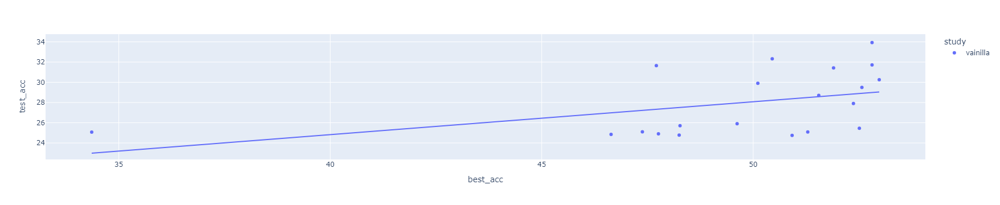

In [142]:
scatter_df=vainilla_students["SE_D"][0]
scatter_df=pd.merge(scatter_df, sorted_df["SE_D"][["name","best_acc"]], on="name")
import plotly.express as px
fig = px.scatter(scatter_df,x="best_acc", y="test_acc",color='study', trendline="ols")
#fig.add_scatter(x=x, y=y_std, mode='markers', name='Data2',trendline="ols", marker=dict(color='green'))
fig.show()

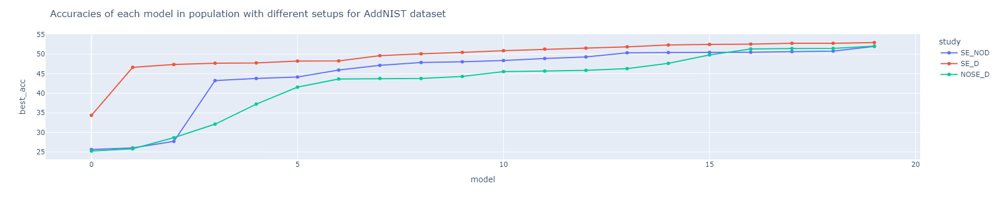

In [10]:
scatter_df=pd.concat([sorted_df["SE_NOD"],sorted_df["SE_D"], sorted_df["NOSE_D"]])

import plotly.express as px

fig = px.line(scatter_df,x="level_0", y="best_acc",color='study', markers=True)
#fig.add_scatter(x=x, y=y_std, mode='markers', name='Data2',trendline="ols", marker=dict(color='green'))
fig.update_layout(height=700)
fig.update_layout(xaxis_title='model', title="Accuracies of each model in population with different setups for AddNIST dataset")
fig.show()


In [7]:
sorted_df["SE_NOD"]

,level_0,index,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,name,study
0,0,84,5,0.009045,25.17,1.39,25.63,49.62,1.42,117.21,happy_raven,SE_NOD
1,1,317,18,0.000545,25.42,1.39,26.03,50.59,1.43,102.43,magic_sidewinder,SE_NOD
2,2,19,20,0.001464,27.24,1.38,27.71,52.81,1.38,105.72,wakeful_mongoose,SE_NOD
3,3,155,16,0.001464,42.72,1.19,43.27,71.72,1.18,97.74,heavenly_squirrel,SE_NOD
4,4,217,18,0.000545,43.65,1.17,43.80,72.17,1.22,85.15,flying_capuchin,SE_NOD
5,5,198,19,0.000245,43.79,1.17,44.17,73.01,1.16,58.59,loutish_tiger,SE_NOD
6,6,138,19,0.000245,46.17,1.13,45.97,74.08,1.32,88.57,dynamic_wasp,SE_NOD
7,7,357,18,0.000545,47.84,1.10,47.15,75.83,1.14,128.26,invaluable_cormorant,SE_NOD
8,8,379,20,0.000062,47.34,1.11,47.87,75.97,1.11,68.30,optimal_elk,SE_NOD
9,9,38,19,0.000245,47.83,1.11,48.05,76.00,1.11,59.20,didactic_zebu,SE_NOD


In [18]:
corr_coeff_vainilla[name]

,index,0,study
0,0,0.431218,SE_D
1,1,0.520268,SE_D
2,2,0.694358,SE_D
3,3,0.702453,SE_D
4,4,0.782447,SE_D
5,5,0.925774,SE_D
6,6,0.918044,SE_D
7,7,0.888181,SE_D
8,8,0.939186,SE_D
9,9,0.976391,SE_D


In [173]:
def scatter_results(chromosomes,columny,columnx="flops",results_path=None):
    """
    Creates a scatter plot of FLOPS (Floating Point Operations Per Second) versus a specified column's values
    for each chromosome.

    Args:
        chromosomes (dict): A dictionary where keys represent chromosome names and values represent
            information about the chromosome, including FLOPS ('flops'), WA ('Width slope'), W0 ('Initial width'), WM ('Width multiplier'), DEPTH ('Total depth')m.
        column (str): The name of the column from the chromosome information to plot against FLOPS.

    Returns:
        plotly.graph_objs._figure.Figure: A Plotly figure displaying a scatter plot of FLOPS versus
            the specified column's values for each chromosome.

    """
    chromosomes_df=pd.DataFrame(chromosomes).T.reset_index().rename(columns={"index":"name"})
    if results_path is not None:
        results_df=pd.read_csv(results_path, index_col=0)[["name","best_acc","epoch_time"]]
        chromosomes_df=pd.merge(chromosomes_df,results_df, on="name", how="left")
    chromosomes_df["W0/WA"]=chromosomes_df["W0"]/chromosomes_df["WA"]
    chromosomes_df["W0/WA"]=chromosomes_df["W0/WA"].round(2)
    fig = go.Figure(data=go.Scatter(
        x=chromosomes_df[columnx],
        y=chromosomes_df[columny],
        mode='markers',
        #marker=dict(
        #    size=2,
            #color=np.random.randn(500), #set color equal to a variable
            #colorscale='Viridis', # one of plotly colorscales
            #showscale=True
        #),
        marker=dict(
            size=10
        ),
        text=chromosomes_df['name']
    ))
    layout = go.Layout(
        title='',
        xaxis=dict(title=columnx),
        yaxis=dict(title=columny),
        template="presentation"
    )
    fig.layout=layout
    return fig

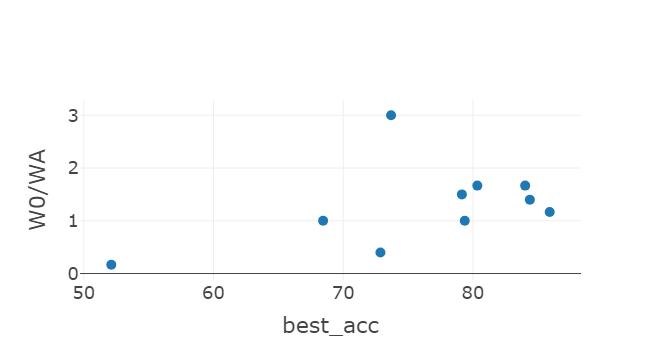

In [156]:
scatter_results(chromosomes,  "W0/WA","best_acc","tests_one_model/Generation_1_NOSE_D/results.csv")

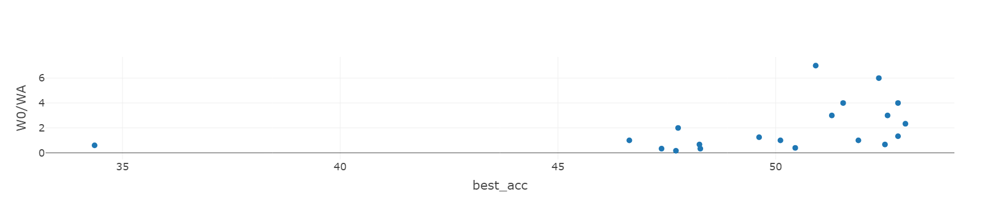

In [154]:
scatter_results(chromosomes,  "W0/WA","best_acc","tests_cifar_tile/Generation_1_SE_D/results.csv")

In [11]:
def _generate_regnet(w_a, w_0, w_m, d, q=8):
        """Generates per stage widths and depths from RegNet parameters."""
        assert w_a >= 0 and w_0 > 0 and w_m > 1 and w_0 % q == 0
        # Generate continuous per-block ws
        ws_cont = np.arange(d) * w_a + w_0
        print("ws_cont: ",ws_cont)
        # Generate quantized per-block ws
        ks = np.round(np.log(ws_cont / w_0) / np.log(w_m))
        print("ks: ",ks)
        #print("ks: ",ks)
        ws_all = w_0 * np.power(w_m, ks)
        ws_all = np.round(np.divide(ws_all, q)).astype(int) * q
        print("ws_all:", ws_all)
        # Generate per stage ws and ds (assumes ws_all are sorted)
        ws, ds = np.unique(ws_all, return_counts=True)
        # Compute number of actual stages and total possible stages
        num_stages, total_stages = len(ws), ks.max() + 1
        print("num_stages", num_stages)
        print("total_stages",total_stages)
        # Convert numpy arrays to lists and return
        ws, ds, ws_all, ws_cont = (x.tolist() for x in (ws, ds, ws_all, ws_cont))
        return ws, ds, num_stages, total_stages, ws_all, ws_cont

In [158]:

chromosomes["olive_wasp"]
#chromosomes["honest_saluki"]
#chromosomes["zircon_toad"]
#chromosomes["hypersonic_sambar"]
#hypersonic_zambar
#quizzical_caiman

{'ws': [8, 72, 144, 288, 592, 1216],
 'bs': [1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 'gs': [8, 8, 8, 8, 8, 8],
 'ds': [1, 1, 3, 4, 9, 2],
 'num_stages': 6,
 'total_size_mb': 62.95697021484375,
 'h': 1,
 'w': 1,
 'flops': 2793680,
 'params': 16503792,
 'acts': 11504,
 'WA': 48.0,
 'W0': 8,
 'WM': 2.05,
 'DEPTH': 20,
 'GROUP_W': 8}

In [130]:
_generate_regnet(40, 32, 2.2, 14, q=8)

ws_cont:  [ 32  72 112 152 192 232 272 312 352 392 432 472 512 552]
ks:  [0. 1. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 4. 4.]
ws_all: [ 32  72 152 152 152 344 344 344 344 344 344 344 752 752]
num_stages 5
total_stages 5.0


([32, 72, 152, 344, 752],
 [1, 1, 3, 7, 2],
 5,
 5.0,
 [32, 72, 152, 152, 152, 344, 344, 344, 344, 344, 344, 344, 752, 752],
 [32, 72, 112, 152, 192, 232, 272, 312, 352, 392, 432, 472, 512, 552])

# Geosclassing

In [2]:
metadata={'input_shape': [50000, 3, 64, 64],
 'codename': 'Sadie',
 'benchmark': 80.33,
 'num_classes': 10,
 'rand_augment': False}
regnet_space=RegNet(metadata,
                    W0=[16, 64, 8],
                    WA=[8, 48, 8],
                    WM=[2.05,2.9,0.05],
                    D=[8,22,1], 
                    G=[8,8,8], 
                    base_config="../configs/search_space/config.yaml")
test_folder="test_dist_population"
generation=1
#models, chromosomes=regnet_space.create_first_generation(save_folder=test_folder,gen=generation, size=20, config_updates=None)

In [3]:
#WA,W0,WM,DEPTH=48,24,2.4,12
test_folder="tests_geoclassing"
generation=1
config_updates=None
models, chromosomes=regnet_space.load_generation(folder=f"{test_folder}/Generation_{generation}", config_updates=config_updates)


res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0, 'dropout_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0, 'dropout_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0, 'dropout_rate': 0.0}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.0, 'dropout_rate': 0.0}
{'stem_type': 'res_stem_cifar', 'stem_w': 64, 'block_type': 'res_bottleneck_block', 'depths': [1, 3, 10, 3], 'widths': [48, 136, 400, 1168], 'strides': [2, 2, 2, 2], 'bot_muls': [1.0, 1.0, 1.0, 1.0], 'group_ws': [8, 8, 8, 8], 'head_w': 0, 'se_r': 0.25, 'num_classes': 10, 'downsample': 'avg', 'drop_path_rate': 0.0, 'dropout_rate': 0.0}
Loading model: tests_geoclassing/Generation_1/cautious_chipmunk/config.yaml
res_bottleneck_block
res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 

In [7]:
folders=["tests_geoclassing/Generation_1_SE_D_warmup_labels01_s1", "tests_geoclassing/Generation_1_SE_D_s1"]
sorted_df={}
corr_coeff_vainilla={}
vainilla_students={}
order_students={}
for folder in folders:#
    name=f"{folder.split("/")[1][13:]}"
    try:
        order_students[name], sorted_df[name], vainilla_students[name], corr_coeff=get_vainilla_dfs(folder, 20, True)
    except:
        order_students[name], sorted_df[name], vainilla_students[name], corr_coeff=get_vainilla_dfs(folder, 2, True)
    sorted_df[name]["study"]=name
    sorted_df[name]= sorted_df[name].reset_index().reset_index()
    corr_coeff_vainilla[name]=pd.DataFrame(corr_coeff).reset_index()
    corr_coeff_vainilla[name]["study"]=name

['cautious_chipmunk', 'cobalt_wildebeest', 'amber_otter', 'lavender_partridge', 'fascinating_binturong', 'resolute_degu', 'pristine_sturgeon', 'ambrosial_iguana', 'jolly_chupacabra', 'shaggy_alpaca', 'fractal_buzzard', 'garrulous_swan', 'independent_unicorn', 'mutant_baboon', 'lemon_panther', 'fat_vulture', 'apricot_numbat', 'saffron_shrimp', 'results.csv', 'sly_orca', 'nocturnal_caribou']
['cautious_chipmunk', 'cobalt_wildebeest', 'amber_otter', 'lavender_partridge', 'fascinating_binturong', 'resolute_degu', 'pristine_sturgeon', 'ambrosial_iguana', 'jolly_chupacabra', 'shaggy_alpaca', 'fractal_buzzard', 'garrulous_swan', 'independent_unicorn', 'mutant_baboon', 'lemon_panther', 'fat_vulture', 'apricot_numbat', 'saffron_shrimp', 'sly_orca', 'nocturnal_caribou']


In [24]:
sorted_df[name]

,level_0,index,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,name,study
0,0,218,19,0.000245,90.74,0.27,85.26,94.93,0.69,71.28,fractal_buzzard,SE_D_s1
1,1,336,17,0.000955,88.78,0.32,86.49,95.50,0.39,76.99,apricot_numbat,SE_D_s1
2,2,316,17,0.000955,91.87,0.23,88.10,96.07,0.35,62.95,fat_vulture,SE_D_s1
3,3,395,16,0.001464,90.78,0.26,88.13,96.04,0.35,77.52,nocturnal_caribou,SE_D_s1
4,4,159,20,0.000062,96.01,0.11,88.96,96.13,0.72,114.73,ambrosial_iguana,SE_D_s1
5,5,299,20,0.000062,94.84,0.15,89.17,96.69,0.44,120.74,lemon_panther,SE_D_s1
6,6,117,18,0.000545,94.47,0.16,89.23,96.51,0.32,72.30,resolute_degu,SE_D_s1
7,7,277,18,0.000545,94.69,0.15,89.32,96.63,0.37,94.28,mutant_baboon,SE_D_s1
8,8,19,20,0.000062,96.56,0.10,89.35,96.43,0.73,154.54,cautious_chipmunk,SE_D_s1
9,9,238,19,0.000245,95.27,0.14,89.35,96.66,0.32,83.42,garrulous_swan,SE_D_s1


In [19]:
#sorted_df[name].to_csv("tests_geoclassing/Generation_1_SE_D_warmup_labels01_s1/results.csv")

In [6]:
kd_students, corr_coeff_kd=get_students_dfs("tests_geoclassing/Generation_1_SE_D_s1_dropout_randaugment", 3, sorted_df["SE_D"],order_students["SE_D"], "SE_D_label", corr=True, corr_n=20)

In [5]:
corr_coeff_kd

[0.6586697576744236, 0.363109160212504, 0.5034108715670507]

In [17]:
kd_students[0].sort_values("test_acc_top5")

,epoch,lr,train_acc,train_loss,test_acc,test_acc_top5,test_loss,epoch_time,name,study
48,1,0.000029,27.77,2.05,40.33,57.67,1.69,92.00,apricot_numbat,SE_D_label
0,1,0.000029,31.81,2.05,43.10,62.19,2.82,169.87,cautious_chipmunk,SE_D_label
30,1,0.000029,27.01,2.07,41.57,62.79,1.88,95.63,fractal_buzzard,SE_D_label
3,1,0.000029,33.61,1.94,42.29,63.57,2.32,91.85,cobalt_wildebeest,SE_D_label
51,1,0.000029,30.39,2.11,45.90,64.29,2.04,157.75,saffron_shrimp,SE_D_label
57,1,0.000029,30.78,1.99,45.55,64.93,1.70,104.03,nocturnal_caribou,SE_D_label
21,1,0.000029,30.86,2.04,47.56,64.96,2.35,132.12,ambrosial_iguana,SE_D_label
42,1,0.000029,26.84,2.06,45.08,65.26,1.98,126.06,lemon_panther,SE_D_label
12,1,0.000029,33.30,1.95,48.25,66.72,1.87,97.24,fascinating_binturong,SE_D_label
27,1,0.000029,32.22,1.98,47.64,66.81,1.61,104.99,shaggy_alpaca,SE_D_label


In [16]:
sorted_df["SE_D_warmup_labels01_s1"]

,level_0,index,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,name,study
0,0,218,19,0.000545,89.21,0.76,84.92,94.48,0.62,65.79,fractal_buzzard,SE_D_warmup_labels01_s1
1,1,339,20,0.000245,88.61,0.78,85.04,94.56,0.51,63.73,apricot_numbat,SE_D_warmup_labels01_s1
2,2,398,19,0.000545,91.53,0.72,87.05,96.08,0.43,77.38,nocturnal_caribou,SE_D_warmup_labels01_s1
3,3,119,20,0.000245,94.36,0.65,88.47,96.23,0.40,69.17,resolute_degu,SE_D_warmup_labels01_s1
4,4,319,20,0.000245,91.30,0.73,88.79,95.96,0.40,61.92,fat_vulture,SE_D_warmup_labels01_s1
5,5,255,16,0.002061,92.83,0.67,89.27,96.36,0.66,106.14,independent_unicorn,SE_D_warmup_labels01_s1
6,6,18,19,0.000545,95.40,0.62,89.40,96.22,1.73,158.64,cautious_chipmunk,SE_D_warmup_labels01_s1
7,7,299,20,0.000245,93.88,0.66,89.97,96.47,1.31,107.10,lemon_panther,SE_D_warmup_labels01_s1
8,8,275,16,0.002061,92.56,0.69,90.17,96.85,0.36,92.37,mutant_baboon,SE_D_warmup_labels01_s1
9,9,356,17,0.001464,93.56,0.66,90.27,96.92,0.34,142.52,saffron_shrimp,SE_D_warmup_labels01_s1


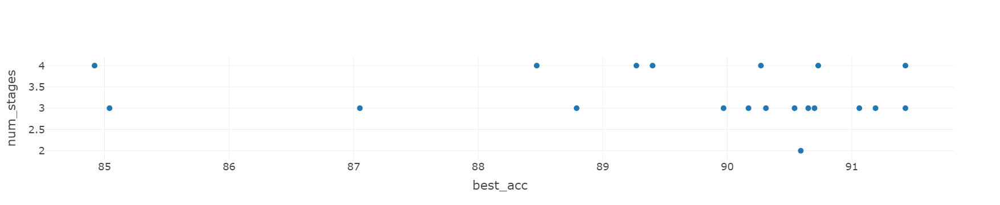

In [8]:
scatter_results(chromosomes,  "num_stages","best_acc","tests_geoclassing/Generation_1_SE_D_warmup_labels01_s1/results.csv")

In [32]:
chromosomes

{'cautious_chipmunk': {'ws': [48, 136, 400, 1168],
  'bs': [1.0, 1.0, 1.0, 1.0],
  'gs': [8, 8, 8, 8],
  'ds': [1, 3, 10, 3],
  'num_stages': 4,
  'total_size_mb': 53.53633117675781,
  'h': 1,
  'w': 1,
  'flops': 2389684,
  'params': 14034228,
  'acts': 9684,
  'WA': 48.0,
  'W0': 48,
  'WM': 2.899999999999997,
  'DEPTH': 17,
  'GROUP_W': 8},
 'cobalt_wildebeest': {'ws': [48, 104, 224],
  'bs': [1.0, 1.0, 1.0],
  'gs': [8, 8, 8],
  'ds': [1, 4, 4],
  'num_stages': 3,
  'total_size_mb': 2.7150497436523438,
  'h': 1,
  'w': 1,
  'flops': 111078,
  'params': 711734,
  'acts': 1670,
  'WA': 24.0,
  'W0': 48,
  'WM': 2.1499999999999995,
  'DEPTH': 9,
  'GROUP_W': 8},
 'amber_otter': {'ws': [56, 160, 456],
  'bs': [1.0, 1.0, 1.0],
  'gs': [8, 8, 8],
  'ds': [3, 11, 1],
  'num_stages': 3,
  'total_size_mb': 4.9694671630859375,
  'h': 1,
  'w': 1,
  'flops': 181340,
  'params': 1302716,
  'acts': 2892,
  'WA': 16.0,
  'W0': 56,
  'WM': 2.849999999999997,
  'DEPTH': 15,
  'GROUP_W': 8},
 'lave

In [31]:
num_combinations = 30

# Determine the number of bins per parameter (assuming an equal split)
num_bins = int(np.ceil(num_combinations**(1/3)))  # fourth root of 20

In [4]:
# Generate equally spaced values within the specified ranges
import numpy as np
from itertools import product
import random

# Create the Cartesian product of these values
all_combinations = list(product(regnet_space.WA_OPTIONS, regnet_space.WM_OPTIONS, regnet_space.D_OPTIONS))

num_combinations=25
# Calculate the step sizes based on the desired number of samples
step_size = len(all_combinations) // num_combinations

# Select evenly spaced combinations
selected_combinations = all_combinations[::step_size][:num_combinations]

In [5]:
selected_combinations

[(8, 2.05, 8),
 (8, 2.249999999999999, 12),
 (8, 2.4499999999999984, 16),
 (8, 2.6499999999999977, 20),
 (8, 2.899999999999997, 9),
 (16, 2.1999999999999993, 13),
 (16, 2.3999999999999986, 17),
 (16, 2.599999999999998, 21),
 (16, 2.849999999999997, 10),
 (24, 2.1499999999999995, 14),
 (24, 2.3499999999999988, 18),
 (24, 2.549999999999998, 22),
 (24, 2.799999999999997, 11),
 (32, 2.0999999999999996, 15),
 (32, 2.299999999999999, 19),
 (32, 2.549999999999998, 8),
 (32, 2.7499999999999973, 12),
 (40, 2.05, 16),
 (40, 2.249999999999999, 20),
 (40, 2.4999999999999982, 9),
 (40, 2.6999999999999975, 13),
 (40, 2.899999999999997, 17),
 (48, 2.1999999999999993, 21),
 (48, 2.4499999999999984, 10),
 (48, 2.6499999999999977, 14)]

# Results full NAS

In [30]:
import pandas as pd
import json
import plotly.graph_objects as go
import plotly.express as px

import sys
sys.path.append("../")
from search_space.RegNet import RegNet

In [31]:
test_folder="tests_LaMelo_08_06_2024_09_06"
file_path=f"{test_folder}/{test_folder}.evonas"
with open(file_path, 'r') as file:
    results = json.load(file)

In [32]:
results.keys()

dict_keys(['correlation', 'results', 'parents', 'metadata', 'best_model', 'parameters', 'total_time'])

In [33]:
df=pd.read_json(results["results"])

/tmp/ipykernel_1040086/3698866666.py:1: FutureWarning:

Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.



In [2]:

def scatter_results(chromosomes_df,columny,columnx):
    """
    Creates a scatter plot of FLOPS (Floating Point Operations Per Second) versus a specified column's values
    for each chromosome.

    Args:
        chromosomes (dict): A dictionary where keys represent chromosome names and values represent
            information about the chromosome, including FLOPS ('flops'), WA ('Width slope'), W0 ('Initial width'), WM ('Width multiplier'), DEPTH ('Total depth')m.
        column (str): The name of the column from the chromosome information to plot against FLOPS.

    Returns:
        plotly.graph_objs._figure.Figure: A Plotly figure displaying a scatter plot of FLOPS versus
            the specified column's values for each chromosome.

    """
    chromosomes_df["generation"]=chromosomes_df["generation"].astype(str)
    fig = px.scatter(
        chromosomes_df,
        x=columny,
        y=columnx,
        #mode='markers',
        color="generation",
        #marker=dict(
        #    size=2,
            #color=np.random.randn(500), #set color equal to a variable
            #colorscale='Viridis', # one of plotly colorscales
            #showscale=True
        #),
        #marker=dict(
        #    size=10
        #),
        #text=chromosomes_df['name']
    )
    #layout = go.Layout(
    #    title='',
    #    xaxis=dict(title=columnx),
    #    yaxis=dict(title=columny),
    #    template="presentation"
    #)
    #fig.layout=layout
    fig.update_layout(height=600, template="presentation")
    return fig

In [35]:
df

,name,ws,ds,num_stages,params,WA,W0,WM,DEPTH,GROUP_W,epoch,lr,train_acc,train_loss,best_acc,test_acc_top5,test_loss,epoch_time,study,generation
0,resourceful_okapi,"[56, 136, 352, 872]","[1, 3, 7, 3]",4,8019728,48,56,2.50,14,8,3,0.000044,35.90,1.84,42.41,64.84,1.52,80.79,vainilla,1
1,cherry_nightingale,"[72, 192, 528]","[2, 9, 1]",3,1561036,24,72,2.70,12,8,3,0.000044,38.43,1.80,45.46,67.63,1.46,63.22,vainilla,1
2,spectral_dolphin,"[96, 216, 488]","[1, 4, 4]",3,2988982,56,96,2.25,9,8,3,0.000044,39.29,1.78,46.95,68.53,1.43,60.02,vainilla,1
3,angelic_kittiwake,"[88, 184, 368]","[2, 6, 9]",3,3912600,24,88,2.05,17,8,3,0.000044,35.34,1.85,42.03,64.05,1.52,83.56,vainilla,1
4,imaginary_crocodile,"[80, 168, 368, 792]","[1, 4, 7, 1]",4,4299712,40,80,2.15,13,8,3,0.000044,37.22,1.81,42.39,64.96,1.50,70.64,vainilla,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,successful_polecat,"[120, 304, 784]","[2, 6, 3]",3,6040932,50,120,2.55,11,8,3,0.000044,41.93,1.72,51.12,72.77,1.32,81.47,vainilla,5
96,turquoise_goose,"[104, 272, 728]","[2, 5, 3]",3,4910948,50,104,2.65,10,8,3,0.000044,41.90,1.73,49.54,71.57,1.36,66.87,vainilla,5
97,upbeat_cicada,"[120, 328, 904]","[1, 5, 3]",3,7314636,80,120,2.75,9,8,3,0.000044,43.18,1.70,53.38,75.16,1.27,66.10,vainilla,5
98,vermilion_pug,"[112, 296, 784]","[2, 5, 3]",3,5697554,56,112,2.65,10,8,3,0.000044,42.98,1.71,53.25,75.10,1.27,67.28,vainilla,5


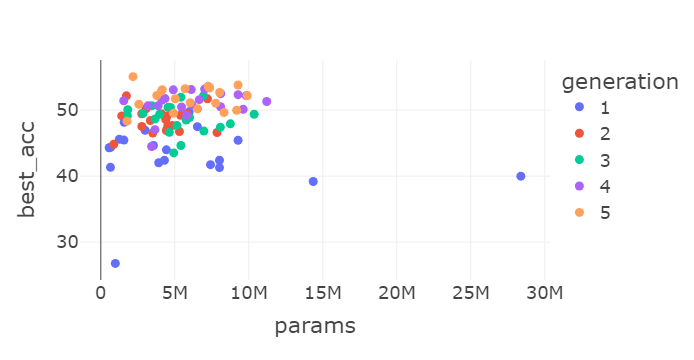

In [36]:
# Evonas Language
scatter_results(df, "params","best_acc")

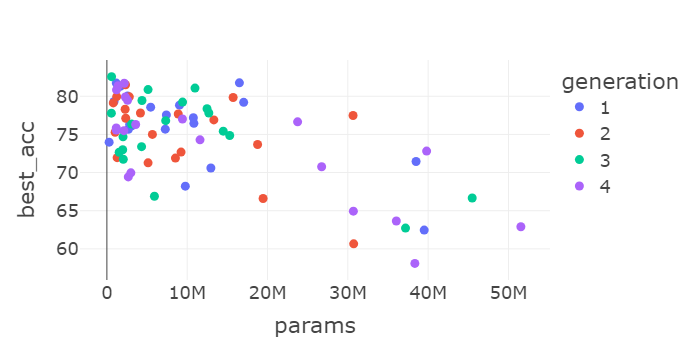

In [75]:
# Random GeoClassing
scatter_results(df, "params","best_acc")

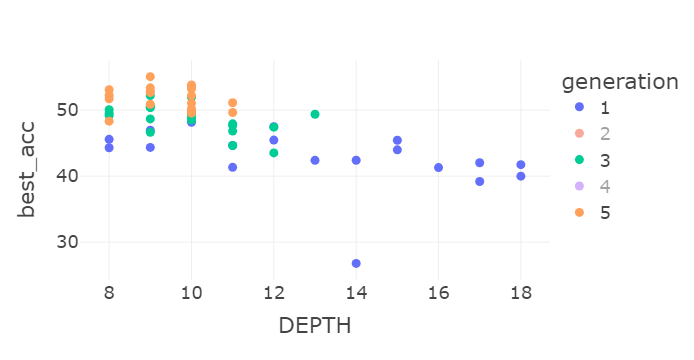

In [37]:
# Evonas Language
scatter_results(df, "DEPTH","best_acc")

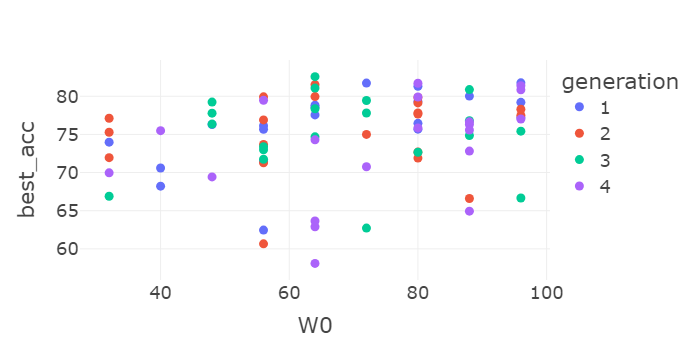

In [57]:
# Random GeoClassing
scatter_results(df, "W0","best_acc")

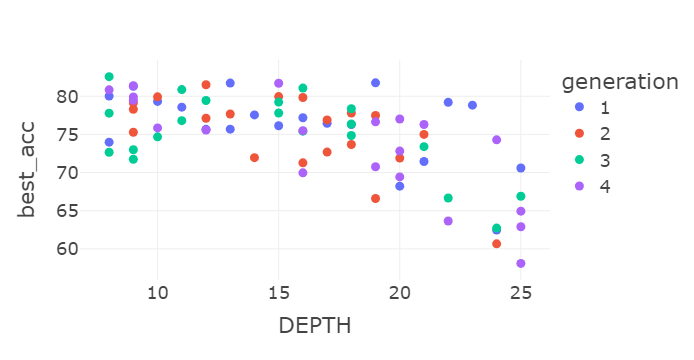

In [58]:
# Random GeoClassing
scatter_results(df, "DEPTH","best_acc")

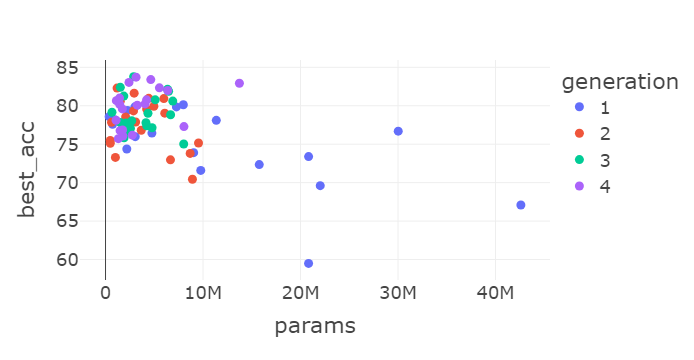

In [69]:
# EvoNas GeoClassing
scatter_results(df, "params","best_acc")

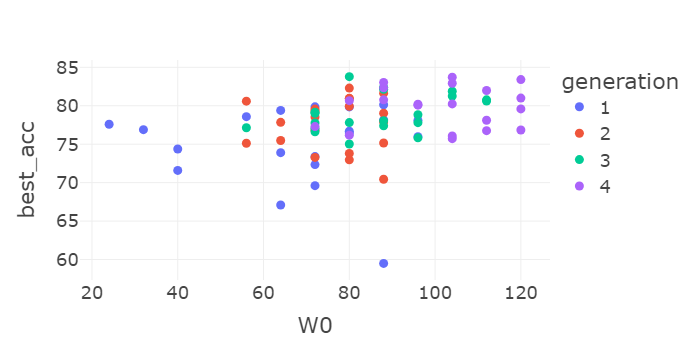

In [ ]:
# EvoNas GeoClassing
scatter_results(df, "W0","best_acc")

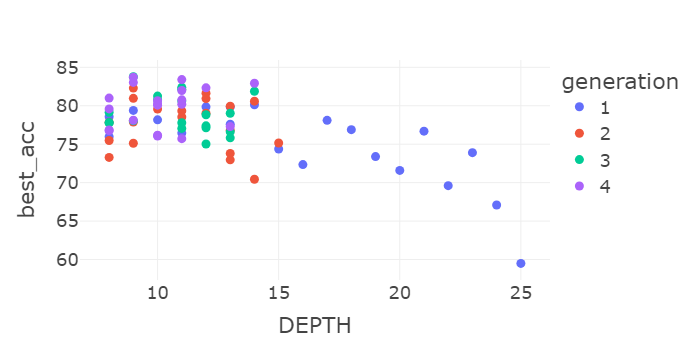

In [65]:
# Evonas GeoClassing
scatter_results(df, "DEPTH","best_acc")

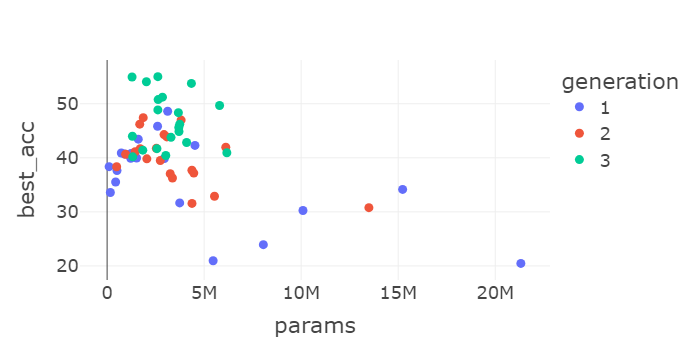

In [81]:
# Evonas AddNIST
scatter_results(df, "params","best_acc")

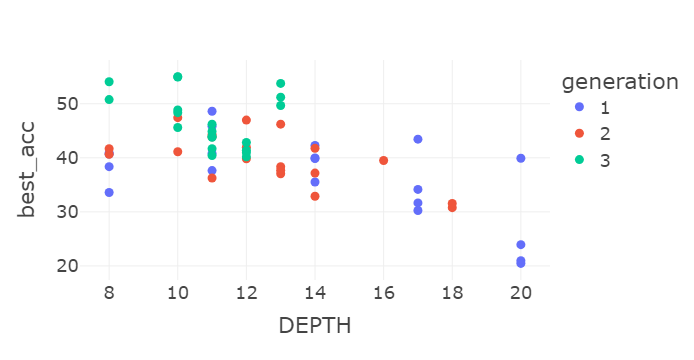

In [82]:
# Evonas AddNIST
scatter_results(df, "DEPTH","best_acc")

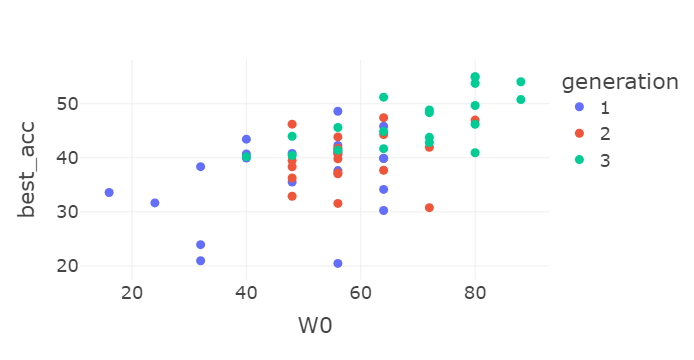

In [86]:
# Evonas AddNIST
scatter_results(df, "W0","best_acc")

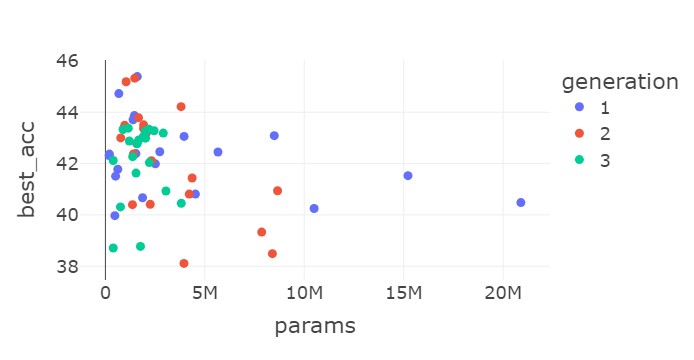

In [92]:
# Evonas CifarTile
scatter_results(df, "params","best_acc")

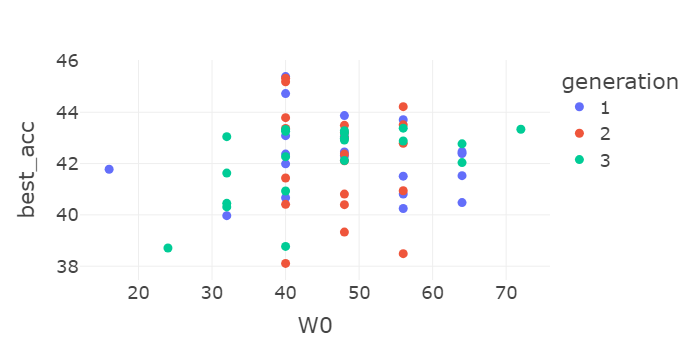

In [97]:
# Evonas CifarTile
scatter_results(df, "W0","best_acc")

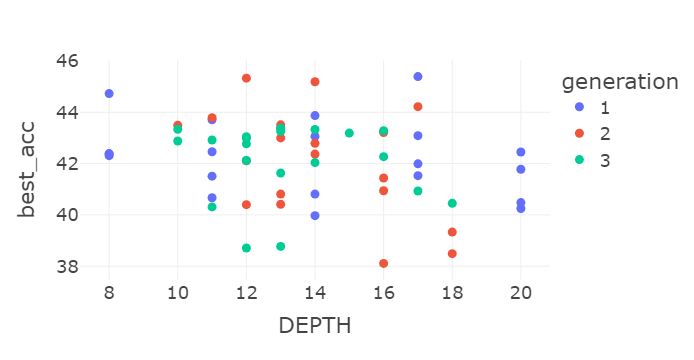

In [98]:
# Evonas CifarTile
scatter_results(df, "DEPTH","best_acc")

In [2]:

metadata={'num_classes': 4,
 'input_shape': [49260, 3, 64, 64],
 'codename': 'Caitie',
 'benchmark': 47.008,
 'rand_augment': False}
regnet_space=RegNet(metadata,
                    W0=[16, 96, 8],
                    WA=[16, 64, 8],
                    WM=[2.05,2.9,0.05],
                    D=[8,25,1], 
                    G=[8,8,8], 
                    base_config="../configs/search_space/config.yaml")

In [5]:
WA,W0,WM,D,W=[float(16),int(32),float(2.5),int(12), int(8)]
model, info=regnet_space.create_model(params=[WA,W0,WM,D,W], save_folder=None, name=None, gen=None, config_updates=None)

res_bottleneck_block
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.01, 'dropout_rate': 0.1}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.01, 'dropout_rate': 0.1}
{'bot_mul': 1.0, 'group_w': 8, 'se_r': 0.25, 'downsample': 'avg', 'drop_path_rate': 0.01, 'dropout_rate': 0.1}
{'stem_type': 'res_stem_cifar', 'stem_w': 64, 'input_channels': 8, 'block_type': 'res_bottleneck_block', 'depths': [2, 4, 6], 'widths': [32, 80, 200], 'strides': [2, 2, 2], 'bot_muls': [1.0, 1.0, 1.0], 'group_ws': [8, 8, 8], 'head_w': 0, 'se_r': 0.25, 'num_classes': 4, 'downsample': 'avg', 'drop_path_rate': 0.01, 'dropout_rate': 0.1}
res_bottleneck_block


In [6]:
from torchsummary import summary

In [7]:
info

{'ws': [32, 80, 200],
 'bs': [1.0, 1.0, 1.0],
 'gs': [8, 8, 8],
 'ds': [2, 4, 6],
 'num_stages': 3,
 'total_size_mb': 2.9799118041992188,
 'h': 1,
 'w': 1,
 'flops': 123166,
 'params': 778286,
 'acts': 1950,
 'WA': 16.0,
 'W0': 32,
 'WM': 2.5,
 'DEPTH': 12,
 'GROUP_W': 8}

In [15]:
summary(model, (8,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           4,608
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
      ResStemCifar-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 32, 64, 64]           2,048
       BatchNorm2d-6           [-1, 32, 64, 64]              64
              ReLU-7           [-1, 32, 64, 64]               0
            Conv2d-8           [-1, 32, 32, 32]           2,304
       BatchNorm2d-9           [-1, 32, 32, 32]              64
             ReLU-10           [-1, 32, 32, 32]               0
AdaptiveAvgPool2d-11             [-1, 32, 1, 1]               0
           Conv2d-12             [-1, 16, 1, 1]             528
             ReLU-13             [-1, 16, 1, 1]               0
           Conv2d-14             [-1, 3

Individuals analysis

In [13]:

df_noaug=results_to_df(f"tests_LaMelo_08_06_2024_09_06/finetuning/dashing_otter_sgd_128_50ep_0025_noaug/worklog.txt", "dashing_otter")
df_aug=results_to_df(f"tests_LaMelo_08_06_2024_09_06/finetuning/dashing_otter_sgd_50_128_swa/worklog.txt", "dashing_otter")

In [14]:
df_noaug["test"]="sgd_no_aug"
df_aug["test"]="sgd_aug"
df=pd.concat([df_noaug, df_aug])

In [15]:
import plotly.express as px
fig = px.line(df, x='epoch', y='test_acc', color='test', markers=False)

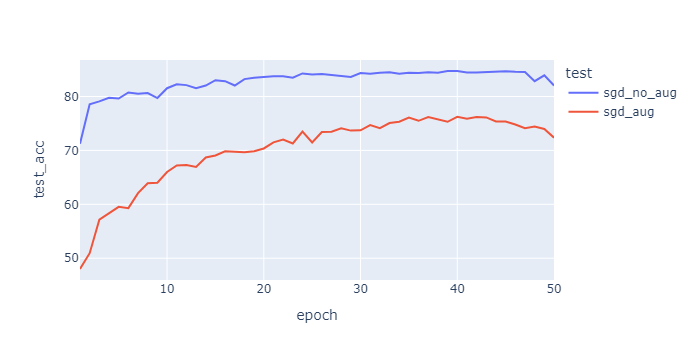

In [16]:
fig

In [3]:
df_adam=results_to_df(f"tests_Caitie_22_05_2024_21_38/finetuning/careful_degu_adam_128_5ep_ 0001_noaug/worklog.txt", "adam")
df_lion=results_to_df(f"tests_Caitie_22_05_2024_21_38/finetuning/careful_degu_lion_128_5ep_ 00001_noaug/worklog.txt", "lion")
df_sgd=results_to_df(f"tests_Caitie_22_05_2024_21_38/finetuning/careful_degu_sgd_128_5ep_001_noaug/worklog.txt", "sgd")

In [4]:
df=pd.concat([df_adam, df_lion, df_sgd])

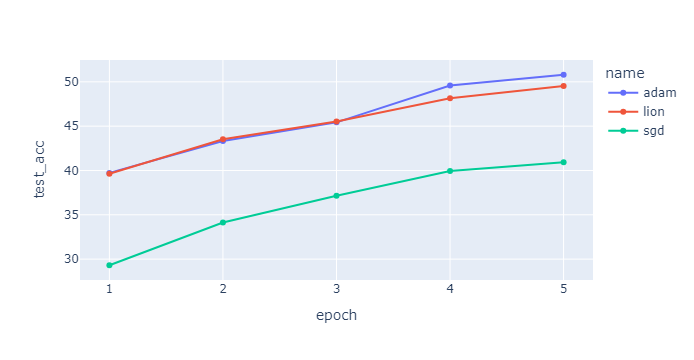

In [5]:
import plotly.express as px
fig = px.line(df, x='epoch', y='test_acc', color='name', markers=True)

fig

In [6]:
df_adam["time"]=df_adam["epoch_time"].cumsum()
df_sgd["time"]=df_sgd["epoch_time"].cumsum()
df_lion["time"]=df_lion["epoch_time"].cumsum()
df=pd.concat([df_adam, df_lion, df_sgd])

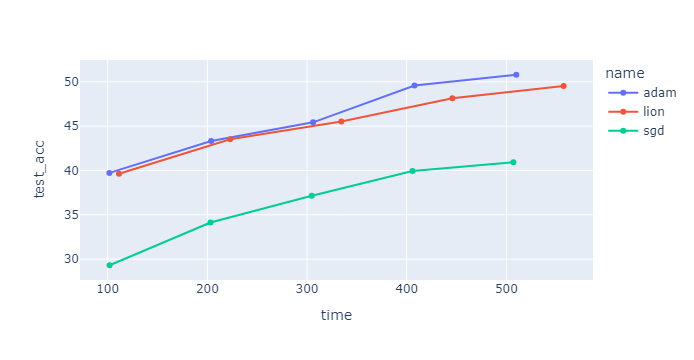

In [7]:
import plotly.express as px
fig = px.line(df, x='time', y='test_acc', color='name', markers=True)

fig